<a href="https://colab.research.google.com/github/RyanChen12035/w266_final_Anatomy-and-Structured-Prunning/blob/main/anatomy_gradient_analysis_Llama2_TSMC_IT_BSID.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install transformers datasets accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.6/302.6 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 16.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64

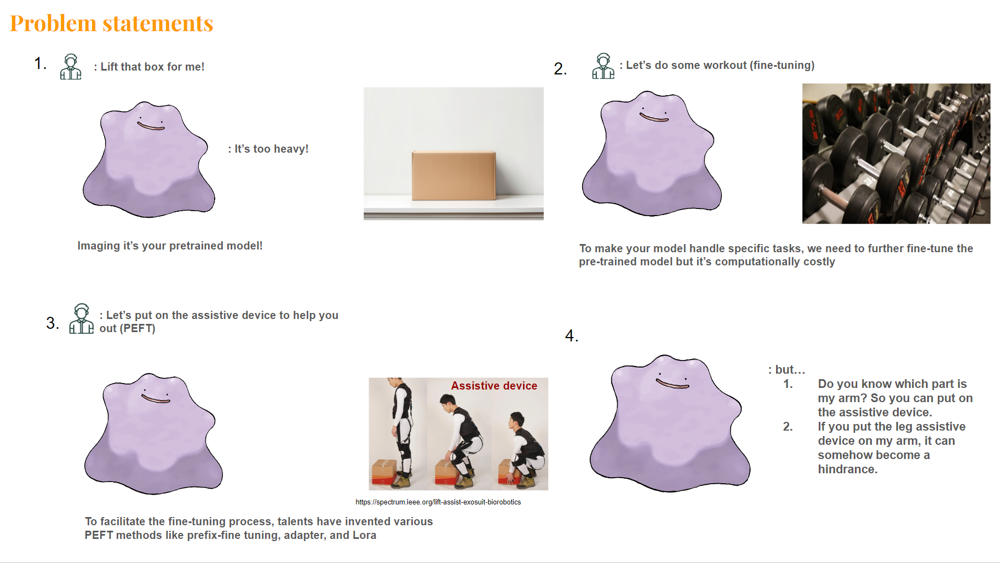

Customize the loss function as sum of embedding of logit token instead of cross entropy of output token and label (with projection layer and softmax on top of the model).

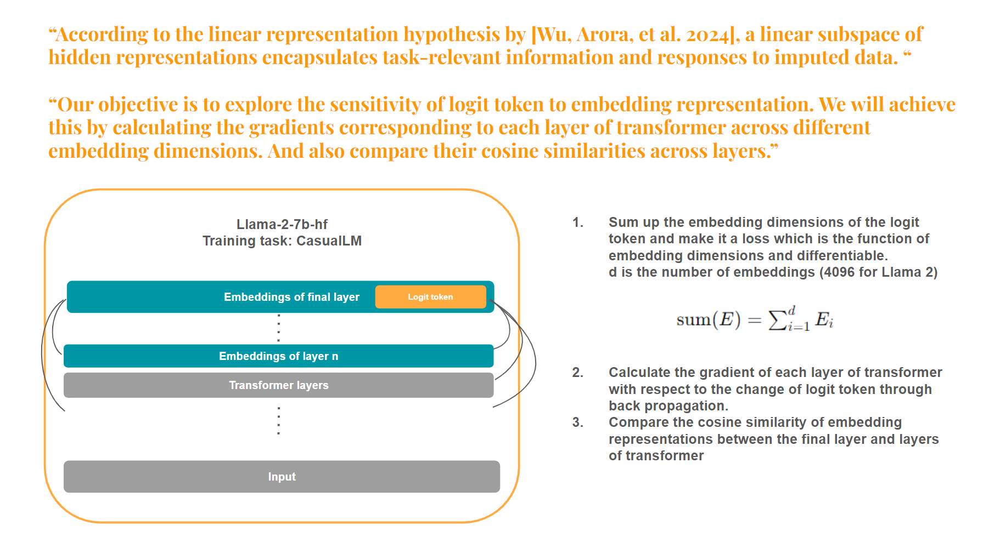

If we skip the template and only apply question, the bright side is that the template wouldn't dilute the information (loss) of the input but for the case of Llama2, it gets delusional easily, a template for me is for the model to understand we are trying to execute the training and inferencing.

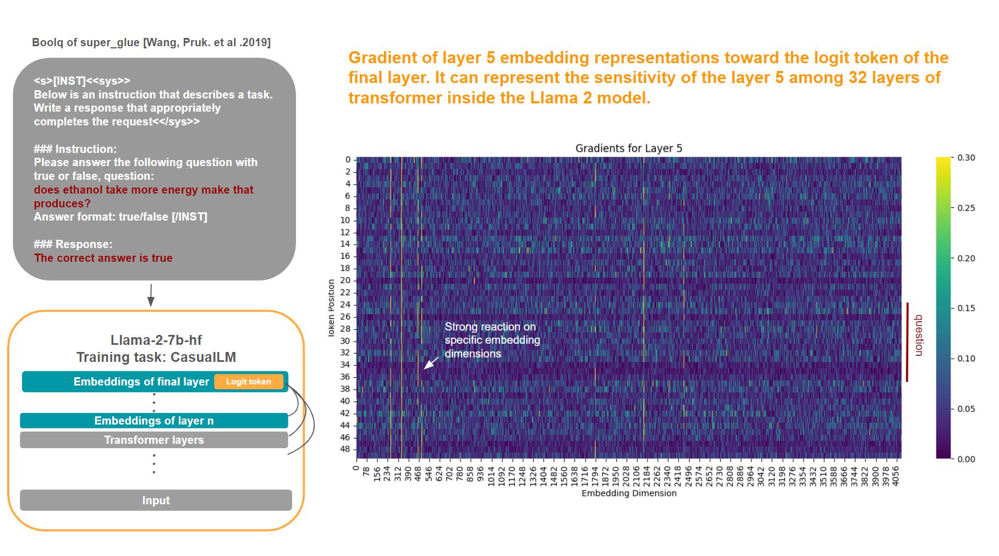

In [ ]:
import torch
from transformers import AutoModelForCausalLM, AutoTokenizer

base_model = "NousResearch/Llama-2-7b-hf"
model = AutoModelForCausalLM.from_pretrained(
    base_model,
    low_cpu_mem_usage=True,
    return_dict=True,
    torch_dtype=torch.float16,
    device_map={"": 0},
)

tokenizer = AutoTokenizer.from_pretrained(base_model, use_fast=True)
tokenizer.pad_token = tokenizer.unk_token
tokenizer.padding_side = "right"

# model is not in training
model.eval()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:492: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`. This was detected when initializing the generation config instance, which means the corresponding file may hold incorrect parameterization and should be fixed.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:497: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.6` -- this flag is only used in sample-based generation modes. You should set `do_

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 4096, padding_idx=0)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaSdpaAttention(
          (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (v_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=4096, out_features=11008, bias=False)
          (up_proj): Linear(in_features=4096, out_features=11008, bias=False)
          (down_proj): Linear(in_features=11008, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm()
        (post_attention_layernorm): LlamaRMSNorm()
      )
    )
    (norm): LlamaRMSNorm()
 

In [ ]:
from datasets import load_dataset
import torch

dataset_name = 'super_glue'
config = 'boolq'
dataset = load_dataset(dataset_name, config)
dataset

DatasetDict({
    train: Dataset({
        features: ['question', 'passage', 'idx', 'label'],
        num_rows: 9427
    })
    validation: Dataset({
        features: ['question', 'passage', 'idx', 'label'],
        num_rows: 3270
    })
    test: Dataset({
        features: ['question', 'passage', 'idx', 'label'],
        num_rows: 3245
    })
})

SFT (supervised fine tuning), feed template + question + answer to the model.

In [ ]:
def template_prompt_engineering(example):
  # add system template of Llama2 and prompt engineering for the boolq task
  example['label'] = "the correct answer is true" if example['label'] else "the correct answer is false"
  example['question'] = f"""Please answer the following queation with true or false, question: {example['question']}?\n\nAnswer format: true/false"""
  example['text'] = f"""<s>[INST]<<sys>>Below is an instruction that describes a task. Write a response that appropriately completes the request<</sys>>
        ### Instruction:
        {example['question']}[/INST]

        ### Response:
        {example['label']}
        """
  return example

dataset_withtemplate = dataset.map(template_prompt_engineering, remove_columns=['question', 'passage', 'idx', 'label'])

In [ ]:
dataset_withtemplate['train']['text'][:4]

['<s>[INST]<<sys>>Below is an instruction that describes a task. Write a response that appropriately completes the request<</sys>>\n        ### Instruction:\n        Please answer the following queation with true or false, question: do iran and afghanistan speak the same language?\n\nAnswer format: true/false[/INST]\n\n        ### Response:\n        the correct answer is true\n        ',
 '<s>[INST]<<sys>>Below is an instruction that describes a task. Write a response that appropriately completes the request<</sys>>\n        ### Instruction:\n        Please answer the following queation with true or false, question: do good samaritan laws protect those who help at an accident?\n\nAnswer format: true/false[/INST]\n\n        ### Response:\n        the correct answer is true\n        ',
 '<s>[INST]<<sys>>Below is an instruction that describes a task. Write a response that appropriately completes the request<</sys>>\n        ### Instruction:\n        Please answer the following queation wi

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cuda')

In [ ]:
texts = dataset_withtemplate['train']['text'][:1]
inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=128)
inputs.to(device)

outputs = model(**inputs, output_hidden_states=True)
last_hidden_state = outputs.hidden_states[-1] # output of last layer of transformer
all_hidden_states = outputs.hidden_states
print(last_hidden_state.shape)
# 4 examples, 94 token seqeunce length, 4096 embedding dimensions

torch.Size([1, 92, 4096])


In [ ]:
len(outputs.hidden_states)

33

In [ ]:
last_hidden_state[:, -1, :].shape #logit token of the last layer of the transformer

torch.Size([1, 4096])

In [ ]:
model.model.layers

ModuleList(
  (0-31): 32 x LlamaDecoderLayer(
    (self_attn): LlamaSdpaAttention(
      (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
      (k_proj): Linear(in_features=4096, out_features=4096, bias=False)
      (v_proj): Linear(in_features=4096, out_features=4096, bias=False)
      (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
      (rotary_emb): LlamaRotaryEmbedding()
    )
    (mlp): LlamaMLP(
      (gate_proj): Linear(in_features=4096, out_features=11008, bias=False)
      (up_proj): Linear(in_features=4096, out_features=11008, bias=False)
      (down_proj): Linear(in_features=11008, out_features=4096, bias=False)
      (act_fn): SiLU()
    )
    (input_layernorm): LlamaRMSNorm()
    (post_attention_layernorm): LlamaRMSNorm()
  )
)

In [ ]:
# Retain gradients for each layer's hidden states

for i, hidden_state in enumerate(all_hidden_states):
    hidden_state.retain_grad()

# Get the last token's hidden state
logit_last = last_hidden_state[:, -1, :]  # shape of 1, 4096
output = logit_last.mean(dim=0).sum()  # Average all examples and sum up as a scalar

# Perform backward pass
model.zero_grad()  # Zero the gradients before the backward pass
output.backward()

# Capture gradients for each layer
layer_gradients = {}
for i, hidden_state in enumerate(all_hidden_states):
    if hidden_state.grad is not None:
        layer_gradients[f'Layer {i+1}'] = hidden_state.clone().detach().cpu().numpy()  # Average over the sequence length
        # clone from computation graph of pytorch, detach from the graph and transfer it to cpu
layer_gradients

{'Layer 1': array([[[ 1.862e-03, -3.372e-03,  3.986e-04, ..., -8.301e-03,
           2.579e-03, -3.937e-03],
         [ 1.862e-03, -3.372e-03,  3.986e-04, ..., -8.301e-03,
           2.579e-03, -3.937e-03],
         [ 5.798e-03, -8.911e-03,  2.795e-02, ...,  1.099e-02,
          -1.434e-02,  1.636e-02],
         ...,
         [-6.287e-03, -2.792e-03,  4.053e-02, ...,  8.667e-03,
          -1.105e-02,  1.575e-02],
         [-7.248e-04,  3.643e-04,  7.725e-05, ...,  4.768e-04,
           5.379e-04, -4.959e-04],
         [-6.012e-03, -4.364e-03, -1.056e-02, ..., -3.723e-03,
           8.423e-03,  4.913e-03]]], dtype=float16),
 'Layer 2': array([[[-0.03096  ,  0.05     , -0.02931  , ..., -0.01367  ,
          -0.02693  ,  0.0676   ],
         [-0.03096  ,  0.05     , -0.02931  , ..., -0.01367  ,
          -0.02693  ,  0.0676   ],
         [ 0.0002213, -0.0094   ,  0.0345   , ...,  0.04852  ,
          -0.02823  ,  0.04926  ],
         ...,
         [-0.03137  , -0.003157 ,  0.0808   , ...,

In [ ]:
layer_gradients['Layer 2'].squeeze(0).shape

(92, 4096)

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow

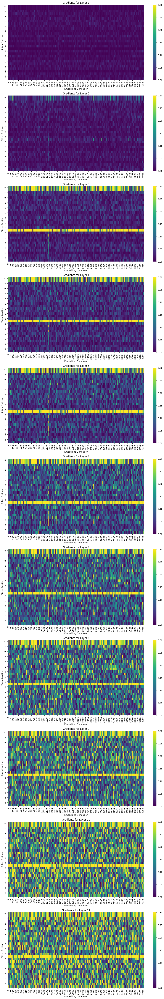

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

layers_to_visualize = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5', 'Layer 6', 'Layer 7', 'Layer 8', 'Layer 9', 'Layer 10', 'Layer 11']

# Setup the number of subplots needed based on the layers you want to visualize
num_layers = len(layers_to_visualize)
fig, axes = plt.subplots(num_layers, 1, figsize=(12, 6 * num_layers))  # Adjust size as needed

# Define the colorbar range
vmin = 0  # Minimum value of the gradient magnitude to display
vmax = 0.3  # Maximum value of the gradient magnitude to display

# Loop through each layer and create a heatmap
for ax, layer in zip(axes, layers_to_visualize):
    gradient_matrix = layer_gradients[layer].squeeze(0)

    first_20_tokens = gradient_matrix[:30, :]
    # Plot heatmap
    sns.heatmap(abs(first_20_tokens), ax=ax, cmap='viridis', cbar=True, vmin=vmin, vmax=vmax)
    ax.set_title(f'Gradients for {layer}')
    ax.set_xlabel('Embedding Dimension')
    ax.set_ylabel('Token Position')

# Show the plot
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:718: RuntimeWarning: overflow

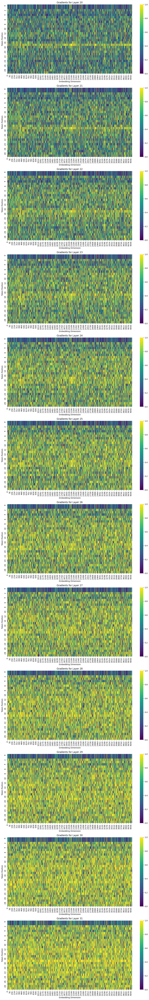

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

layers_to_visualize = ['Layer 20', 'Layer 21', 'Layer 22', 'Layer 23', 'Layer 24', 'Layer 25', 'Layer 26', 'Layer 27', 'Layer 28', 'Layer 29', 'Layer 30', 'Layer 31']

# Setup the number of subplots needed based on the layers you want to visualize
num_layers = len(layers_to_visualize)
fig, axes = plt.subplots(num_layers, 1, figsize=(12, 6 * num_layers))  # Adjust size as needed

# Define the colorbar range
vmin = 0  # Minimum value of the gradient magnitude to display
vmax = 1  # Maximum value of the gradient magnitude to display

# Loop through each layer and create a heatmap
for ax, layer in zip(axes, layers_to_visualize):
    gradient_matrix = layer_gradients[layer].squeeze(0)

    first_20_tokens = gradient_matrix[:30, :]
    # Plot heatmap
    sns.heatmap(abs(first_20_tokens), ax=ax, cmap='viridis', cbar=True, vmin=vmin, vmax=vmax)
    ax.set_title(f'Gradients for {layer}')
    ax.set_xlabel('Embedding Dimension')
    ax.set_ylabel('Token Position')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
# need to find out the position of questions
dataset_withtemplate['train']['text'][:1]

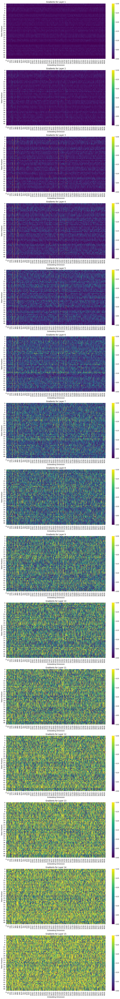

In [ ]:
# get the repsonse of questions, exclude template part.

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

layers_to_visualize = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5', 'Layer 6', 'Layer 7', 'Layer 8', 'Layer 9', 'Layer 10', 'Layer 11', 'Layer 12', 'Layer 13', 'Layer 14', 'Layer 15']

# Setup the number of subplots needed based on the layers you want to visualize
num_layers = len(layers_to_visualize)
fig, axes = plt.subplots(num_layers, 1, figsize=(12, 6 * num_layers))  # Adjust size as needed

# Define the colorbar range
vmin = 0  # Minimum value of the gradient magnitude to display
vmax = 0.3  # Maximum value of the gradient magnitude to display

# Loop through each layer and create a heatmap
for ax, layer in zip(axes, layers_to_visualize):
    gradient_matrix = layer_gradients[layer].squeeze(0)

    first_20_tokens = gradient_matrix[30:80, :]  # exclude cls
    # Plot heatmap
    sns.heatmap(abs(first_20_tokens), ax=ax, cmap='viridis', cbar=True, vmin=vmin, vmax=vmax)
    ax.set_title(f'Gradients for {layer}')
    ax.set_xlabel('Embedding Dimension')
    ax.set_ylabel('Token Position')

# Show the plot
plt.tight_layout()
plt.show()


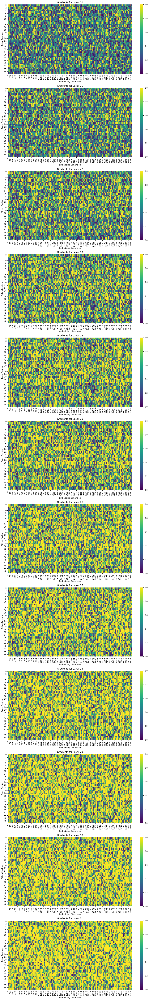

In [ ]:
# get the repsonse of questions

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

layers_to_visualize = ['Layer 20', 'Layer 21', 'Layer 22', 'Layer 23', 'Layer 24', 'Layer 25', 'Layer 26', 'Layer 27', 'Layer 28', 'Layer 29', 'Layer 30', 'Layer 31']

# Setup the number of subplots needed based on the layers you want to visualize
num_layers = len(layers_to_visualize)
fig, axes = plt.subplots(num_layers, 1, figsize=(12, 6 * num_layers))  # Adjust size as needed

# Define the colorbar range
vmin = 0  # Minimum value of the gradient magnitude to display
vmax = 1  # Maximum value of the gradient magnitude to display

# Loop through each layer and create a heatmap
for ax, layer in zip(axes, layers_to_visualize):
    gradient_matrix = layer_gradients[layer].squeeze(0)

    first_20_tokens = gradient_matrix[30:80, :]  # exclude cls
    # Plot heatmap
    sns.heatmap(abs(first_20_tokens), ax=ax, cmap='viridis', cbar=True, vmin=vmin, vmax=vmax)
    ax.set_title(f'Gradients for {layer}')
    ax.set_xlabel('Embedding Dimension')
    ax.set_ylabel('Token Position')

# Show the plot
plt.tight_layout()
plt.show()


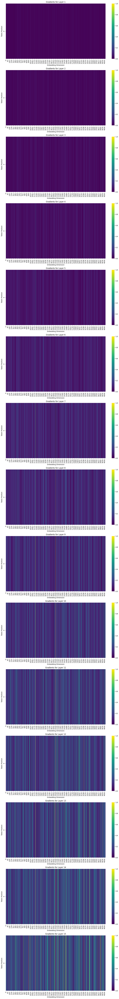

In [ ]:
# get the repsonse of the logit token only.

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

layers_to_visualize = ['Layer 1', 'Layer 2', 'Layer 3', 'Layer 4', 'Layer 5', 'Layer 6', 'Layer 7', 'Layer 8', 'Layer 9', 'Layer 10', 'Layer 11', 'Layer 12', 'Layer 13', 'Layer 14', 'Layer 15']

# Setup the number of subplots needed based on the layers you want to visualize
num_layers = len(layers_to_visualize)
fig, axes = plt.subplots(num_layers, 1, figsize=(12, 6 * num_layers))  # Adjust size as needed

# Define the colorbar range
vmin = 0  # Minimum value of the gradient magnitude to display
vmax = 1  # Maximum value of the gradient magnitude to display

# Loop through each layer and create a heatmap
for ax, layer in zip(axes, layers_to_visualize):
    gradient_matrix = layer_gradients[layer].squeeze(0)

    first_20_tokens = gradient_matrix[-1:, :]
    # Plot heatmap
    sns.heatmap(abs(first_20_tokens), ax=ax, cmap='viridis', cbar=True, vmin=vmin, vmax=vmax)
    ax.set_title(f'Gradients for {layer}')
    ax.set_xlabel('Embedding Dimension')
    ax.set_ylabel('Token Position')

# Show the plot
plt.tight_layout()
plt.show()


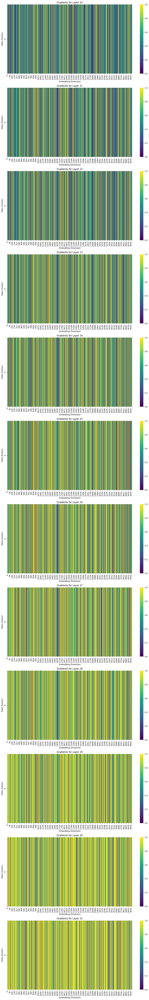

In [ ]:
# get the repsonse of logit token only

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

layers_to_visualize = ['Layer 20', 'Layer 21', 'Layer 22', 'Layer 23', 'Layer 24', 'Layer 25', 'Layer 26', 'Layer 27', 'Layer 28', 'Layer 29', 'Layer 30', 'Layer 31']

# Setup the number of subplots needed based on the layers you want to visualize
num_layers = len(layers_to_visualize)
fig, axes = plt.subplots(num_layers, 1, figsize=(12, 6 * num_layers))  # Adjust size as needed

# Define the colorbar range
vmin = 0  # Minimum value of the gradient magnitude to display
vmax = 1  # Maximum value of the gradient magnitude to display

# Loop through each layer and create a heatmap
for ax, layer in zip(axes, layers_to_visualize):
    gradient_matrix = layer_gradients[layer].squeeze(0)

    first_20_tokens = gradient_matrix[-1:, :]
    # Plot heatmap
    sns.heatmap(abs(first_20_tokens), ax=ax, cmap='viridis', cbar=True, vmin=vmin, vmax=vmax)
    ax.set_title(f'Gradients for {layer}')
    ax.set_xlabel('Embedding Dimension')
    ax.set_ylabel('Token Position')

# Show the plot
plt.tight_layout()
plt.show()


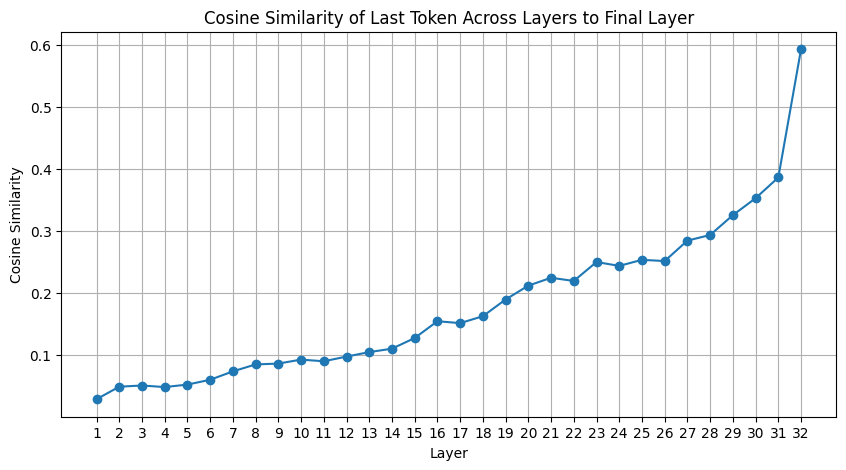

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming hidden_states is obtained from the model outputs
cls_similarities = []

# Extract the last token from the last layer for comparison
final_cls = last_hidden_state[:, -1, :]  # Last layer, last token

for i in range(len(all_hidden_states) - 1):  # Exclude the last layer as it is used for comparison
    current_cls = all_hidden_states[i][:, -1, :]  # Last token of each layer
    # Compute cosine similarity and take the mean across the batch if needed
    cosine_sim = F.cosine_similarity(current_cls, final_cls, dim=1).mean().item()
    cls_similarities.append(cosine_sim)

# Plot the cosine similarities between the last token of each layer and the last layer's last token
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(all_hidden_states)), cls_similarities, marker='o', linestyle='-')
plt.title('Cosine Similarity of Last Token Across Layers to Final Layer')
plt.xlabel('Layer')
plt.ylabel('Cosine Similarity')
plt.xticks(range(1, len(all_hidden_states)))  # Adjust the x-ticks to match layer numbers
plt.grid(True)
plt.show()

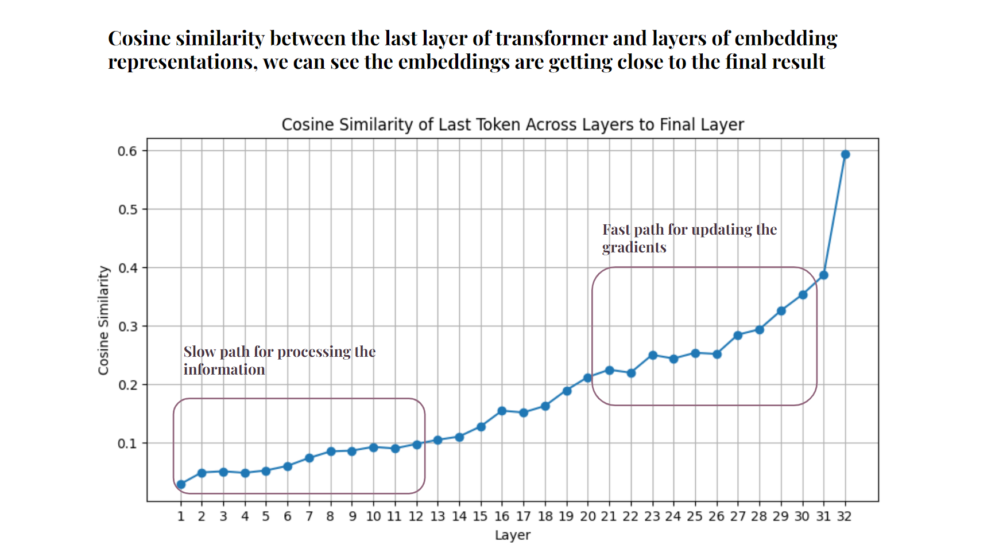